## Lecture 5: Boundary condition and matrix solution

In this notebook, we look at how imposing different boundary conditions will affect the matrix structure and consequently the solution. 

In [1]:
# Initialisation

%matplotlib inline

import matplotlib
from matplotlib import animation, rc
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sympy import *
from scipy.sparse import diags
from ipywidgets import *
from IPython.display import display, Markdown
rc('animation', html='jshtml')

## Hyperbolic equation

We once again examine the propagation of the linear advection equation:

$$
\frac{\partial u}{\partial t} + a \frac{\partial u}{\partial x} = u_t + a u_x = 0
$$

### Upwind space discretisation

Considering an upwind space discretisation, we obtain the following system of ODEs in time

$$
\frac{\mathrm{d}u_i}{\mathrm{d}t} = -\frac{a}{\Delta x} (u_i - u_{i-1})
$$

for the interior points. We also impose a boundary value at the left end boundary when $a > 0$

$$
u_0 = u(0,t) = g(t)
$$

Thus, for the first mesh point $i = 1$, we have

$$
\frac{\mathrm{d} u_1}{\mathrm{d}t} = -\frac{a}{\Delta x} (u_1 - u_0) = -\frac{a}{\Delta x} u_1 + \frac{a}{\Delta x} g(t)
$$

Downstream, the equation for $i = N$ is

$$
\frac{\mathrm{d}u_N}{\mathrm{d}t} = -\frac{a}{\Delta x} (u_N - u_{N-1})
$$

and no additional, numerical boundary condition is necessary. The semi-discretised system of ODEs becomes

$$
\frac{\mathrm{d}U}{\mathrm{d}t} = -\frac{a}{\Delta x}
\begin{bmatrix}
1 & 0 & \cdot & \cdot & & & \cdot \\
-1 & 1 & 0 & \cdot & & & \cdot \\
 & -1 & 1 & \cdot & & & \\
 & & \cdot & \cdot & \cdot & & \\
 & & & \cdot & \cdot & \cdot &\\
 & & & & -1 & 1 & 0 \\
\cdot & & & & & -1 & 1 \\
\end{bmatrix} 
\begin{bmatrix}
u_1 \\ \cdot \\ u_{i-1} \\ u_i \\ u_{i+1} \\ \cdot \\ u_N \\
\end{bmatrix}
+
\begin{bmatrix}
-ag(t)/\Delta x \\ \cdot \\ \cdot \\ \cdot \\ \cdot \\ \cdot \\ \cdot \\  
\end{bmatrix}
$$

We look at an example, where the domain is $x \in [0,1] $ and the initial condition is

$$
u(x,0) = \sin{\pi x}
$$

with

$$
g(t) = 0
$$

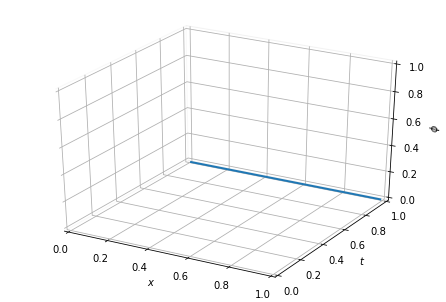

In [2]:
# Initialise arrays and equations
x = Symbol('x')
dx = 0.02
dt = 0.02
a = 1.
xl = np.arange(dx,(1.+dx),dx)
N = len(xl)
u0 = Piecewise((0, x < 0), (sin(2*np.pi*x), x <= 0.5), (0, True))
uc = np.array([u0.subs(x,xi) for xi in xl])
diagonals = [np.ones(N).tolist(), (np.ones(N-1)*-1).tolist()]
S = diags(diagonals, [0, -1]).toarray()

# Initialise plotting
fig = plt.figure()
ax =  Axes3D(fig)

# Equation Line
line, = ax.plot(xl,uc,0,lw=2)

# Visuals
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$t$')
ax.set_zlabel(r'$\phi$')
ax.set_xlim3d([0.,1.])
ax.set_ylim3d([0.,1.])
ax.set_zlim3d([0.,1.])
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False
ax.view_init(azim=300.)

def update1(i):
    global uc
    uc = uc - (a*dt/dx)*np.dot(S,uc)
    line.set_data(xl, dt*i*np.ones(xl.size))
    line.set_3d_properties(uc)
    return line,

def init_fn1():
    return line,

anim1 = animation.FuncAnimation(fig, update1, frames=50, init_func=init_fn1, interval=100, blit=True)
anim1

However, if we impose the physical condition at the downstream end, there is no information on $u_0$ for the first mesh point and the last equation will be replaced by the boundary condition $u_N = g(t)$. The second last mesh point will then become decoupled from the physical information at $u_N$, making it impossible to ensure that a numerical boundary condition at $u_0$ will lead to a downstream value statisfying the downstream boundary condition, causing the problem to be not well-posed.

Conversely, when $a<0$, in order to stabilise the scheme the boundary condition is imposed at $i=N$, $u_N = g(t)$ and a forward space discretisation is used.

Below, we can see an example where we impose the boundary condition at $i=N$, $u_N = g(t)$ but use backward space discretisation. It can be observed that there is a discontinuity at the last two nodes, due to the boundary condition being enforced.

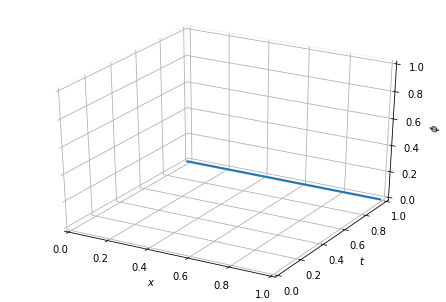

In [3]:
# Initialise arrays and equations
x = Symbol('x')
dx = 0.02
dt = 0.02
a = 1.
L = 1.
xl = np.arange(dx,1.,dx)
N = len(xl)
u0 = Piecewise((0, x < 0), (sin(2*np.pi*x), x <= 0.5), (0, True))
uc = np.array([u0.subs(x,xi) for xi in xl])
diagonals = [np.ones(N).tolist(), (np.ones(N-1)*-1).tolist()]
S = diags(diagonals, [0, -1]).toarray()

# Initialise plotting
fig = plt.figure()
ax =  Axes3D(fig)

# Equation Line
line, = ax.plot(xl,uc,0,lw=2)

# Visuals
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$t$')
ax.set_zlabel(r'$\phi$')
ax.set_xlim3d([0.,1.])
ax.set_ylim3d([0.,1.])
ax.set_zlim3d([0.,1.])
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False
ax.view_init(azim=300.)

def update1(i):
    global uc
    uc = uc - dt*((a/dx)*np.dot(S,uc) + np.array([0]+np.zeros(N-2).tolist()+[0]))
    line.set_data(np.insert(xl, [0, N], [0, L]), dt*i*np.ones(xl.size+2))
    line.set_3d_properties(np.insert(uc, [0, N], [0, 0]))
    return line,

def init_fn1():
    return line,

anim1 = animation.FuncAnimation(fig, update1, frames=50, init_func=init_fn1, interval=100, blit=True)
anim1

### Central space discretisation with periodic boundary condition

If periodic boundary conditions are used, we can obtain for the endpoints $i=0$ and $i=N-1$

$$
\frac{\mathrm{d}u_0}{\mathrm{d}t} = -\frac{a}{2\Delta x} (u_1 - u_{-1}) = -\frac{a}{2\Delta x} (u_1 - u_{N-1})
$$

$$
\frac{\mathrm{d}u_{N-1}}{\mathrm{d}t} = -\frac{a}{2\Delta x} (u_N - u_{N-2}) = -\frac{a}{2\Delta x} (u_0 - u_{N-2})
$$

Our matrix form is thus now

$$
\frac{\mathrm{d}U}{\mathrm{d}t} = -\frac{a}{2 \Delta x}
\begin{bmatrix}
0 & 1 & \cdot & \cdot & & & -1 \\
-1 & 0 & 1 & \cdot & & & \cdot \\
 & -1 & 0 & 1 & & & \\
 & & \cdot & \cdot & \cdot & & \\
 & & & \cdot & \cdot & \cdot &\\
 & & & & -1 & 0 & 1 \\
1 & & & & & -1 & 0 \\
\end{bmatrix} 
\begin{bmatrix}
u_0 \\ \cdot \\ u_{i-1} \\ u_i \\ u_{i+1} \\ \cdot \\ u_{N-1} \\
\end{bmatrix}
$$

with no source term required.

We look again at an example, where the domain is $x \in [0,1] $ and the initial condition is

$$
u(x,0) = \sin{2 \pi x}
$$


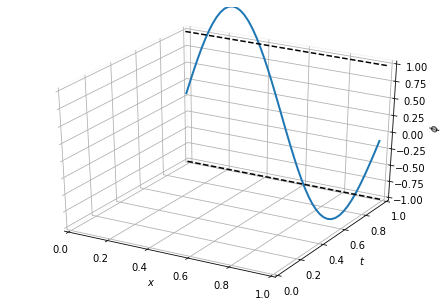

In [4]:
# Initialise arrays and equations
x = Symbol('x')
dx = 0.02
dt = 0.02
a = 1.
xl = np.arange(0.,1.,dx)
N = len(xl)
u0 = Piecewise((0, x < 0), (sin(2*np.pi*x), x <= 1), (0, True))
uc = np.array([u0.subs(x,xi) for xi in xl])
diagonals = [np.ones(N-1).tolist(), (np.ones(N-1)*-1).tolist(), [1], [-1]]
S = diags(diagonals, [1, -1, 1-N, N-1]).toarray()

# Initialise plotting
fig = plt.figure()
ax =  Axes3D(fig)

# Equation Line
line1, = ax.plot(xl,np.zeros(N),uc,lw=2)
line2, = ax.plot([0,1],[0,0],[1,1],'k--')
line3, = ax.plot([0,1],[0,0],[-1,-1],'k--')
lines = [line1, line2, line3]

# Visuals
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'$t$')
ax.set_zlabel(r'$\phi$')
ax.set_xlim3d([0.,1.])
ax.set_ylim3d([0.,1.])
ax.set_zlim3d([-1.,1.])
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False
ax.view_init(azim=300.)

def update2(i):
    global uc
    uc = uc - ((a*dt)/(2*dx))*np.dot(S,uc)
    lines[0].set_data(xl, dt*i*np.ones(xl.size))
    lines[0].set_3d_properties(uc)
    lines[1].set_data([0, 1], [dt*i, dt*i])
    lines[1].set_3d_properties([1, 1])
    lines[2].set_data([0, 1], [dt*i, dt*i])
    lines[2].set_3d_properties([-1, -1])
    return lines

def init_fn2():
    return lines

anim2 = animation.FuncAnimation(fig, update2, frames=50, init_func=init_fn2, interval=100, blit=True)
anim2

It can be observed that the scheme is unstable. For hyperbolic problems, it is known that forward time/central space discretisation is unstable, regardless of the choice of $\Delta t$.

## Parabolic equation

We look at the heat conduction in a beam. The classical heat equation in 1D with no heat addition is

$$
\frac{\partial T}{\partial t} = \alpha \frac{\partial^2 T}{\partial x^2}
$$

A central difference of the space second derivative leads to the semi-discretised scheme of second order accuracy

$$
\frac{\mathrm{d}u_i}{\mathrm{d}t} = \frac{\alpha}{\Delta x^2} (u_{i+1} - 2u_i + u_{i-1})
$$

We will apply different boundary conditions and examine the matrix solution of each boundary condition.

### Dirichlet boundary conditions

The Dirichlet type of condition is defined by

$$
u_0 = u(0,t) = a, \quad u_N = u(L,t) = b
$$

The discretised equation for the first and last mesh points are thus

$$
\frac{\mathrm{d}u_1}{\mathrm{d}t} = \frac{\alpha}{\Delta x^2} (u_{2} - 2u_1 + a)
$$

$$
\frac{\mathrm{d}u_{N-1}}{\mathrm{d}t} = \frac{\alpha}{\Delta x^2} (b - 2u_{N-1} + u_{N-2})
$$

The matrix form is thus

$$
\frac{\mathrm{d}U}{\mathrm{d}t} = \frac{\alpha}{\Delta x^2}
\begin{bmatrix}
-2 & 1 & \cdot & \cdot & & & \cdot \\
1 & -2 & 1 & \cdot & & & \cdot \\
 & 1 & -2 & 1 & & & \\
 & & \cdot & \cdot & \cdot & & \\
 & & & \cdot & \cdot & \cdot &\\
 & & & & 1 & -2 & 1 \\
\cdot & & & & & 1 & -2 \\
\end{bmatrix} 
\begin{bmatrix}
u_1 \\ \cdot \\ u_{i-1} \\ u_i \\ u_{i+1} \\ \cdot \\ u_{N-1} \\
\end{bmatrix}
+
\begin{bmatrix}
a\alpha/\Delta x^2 \\ \cdot \\ \cdot \\ \cdot \\ \cdot \\ \cdot \\ b\alpha/\Delta x^2 \\  
\end{bmatrix}
$$

We now apply this solution to an example, where we consider the domain $x \in [0,L]$ and the initial conditions are 

$$
T(x,0) = \sin(\pi x)
$$

and we set boundary conditions

$$
a = 0, \quad b = 0
$$

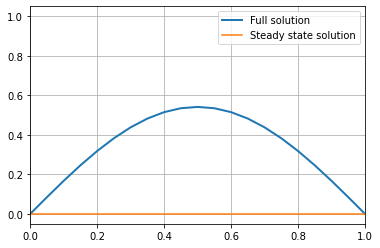

In [5]:
# Initialise arrays and equations
x, t = symbols('x t')
L = 1.
dx = 0.05
dt = 0.01
alpha = 0.1
a = 0.
b = 0.
xl = np.arange(dx,L,dx)
N = len(xl)
xp = np.insert(xl, [0, N], [0, L])
T = sin(np.pi*x)
Tx = [T.subs(x,xi) for xi in xl]
diagonals = [np.ones(N-1).tolist(), (np.ones(N)*-2).tolist(), (np.ones(N-1)).tolist()]
S = diags(diagonals, [1, 0, -1]).toarray()

# Initialise plotting
fig = plt.figure()
ax = plt.axes(xlim=(0,L))
line, = ax.plot(xp,np.insert(Tx, [0, N], [a, b]),lw=2)
Ts = ax.plot([0.,L],[a,b])
ax.grid()
ax.legend(['Full solution', 'Steady state solution'], loc='upper right')

def update3(i):
    global Tx
    Tx = Tx + (alpha*dt/(dx*dx))*np.dot(S,Tx)
    p = line.set_data(xp,np.insert(Tx, [0, N], [a, b]))
    return line,

anim3 = animation.FuncAnimation(fig, update3, frames=60, interval=100, blit=True)
anim3

### Neumann boundary conditions

When Neumann boundary conditions are imposed at an end-point (at $x=0$), with a Dirichlet condition (at $x=L$), we have

$$
\frac{\partial u}{\partial x} (0, t) = a(t), \quad u_N = u(L,t) = b
$$

The first equation for mesh point $i=0$ would then be written with forward difference as

$$
\frac{1}{\Delta x}(u_1 - u_0) = a(t)
$$

The discretised equation for the first and last mesh points are thus

$$
\frac{\mathrm{d}u_1}{\mathrm{d}t} = \frac{\alpha}{\Delta x^2} (u_2 - u_1) - \frac{a \alpha}{\Delta x}
$$

$$
\frac{\mathrm{d}u_{N-1}}{\mathrm{d}t} = \frac{\alpha}{\Delta x^2} (b - 2u_{N-1} + u_{N-2})
$$

The matrix form is thus

$$
\frac{\mathrm{d}U}{\mathrm{d}t} = \frac{\alpha}{\Delta x^2}
\begin{bmatrix}
-1 & 1 & \cdot & \cdot & & & \cdot \\
1 & -2 & 1 & \cdot & & & \cdot \\
 & 1 & -2 & 1 & & & \\
 & & \cdot & \cdot & \cdot & & \\
 & & & \cdot & \cdot & \cdot &\\
 & & & & 1 & -2 & 1 \\
\cdot & & & & & 1 & -2 \\
\end{bmatrix} 
\begin{bmatrix}
u_1 \\ \cdot \\ u_{i-1} \\ u_i \\ u_{i+1} \\ \cdot \\ u_N \\
\end{bmatrix}
+
\begin{bmatrix}
-a\alpha/\Delta x \\ \cdot \\ \cdot \\ \cdot \\ \cdot \\ \cdot \\ b\alpha/\Delta x^2 \\  
\end{bmatrix}
$$

We now apply this solution to an example, where we consider the domain $x \in [0,L]$ and the initial conditions are 

$$
T(x,0) = \sin(\pi x)
$$

and we set boundary conditions

$$
a(t) = \pi e^{-\alpha \pi^2 t}, \quad b = 0
$$

In the plot, the full solution line does not extend to the left (at $x = 0$) as the value is not defined at that point on the left due to the use of Neumann boundary condition instead of Dirichlet.

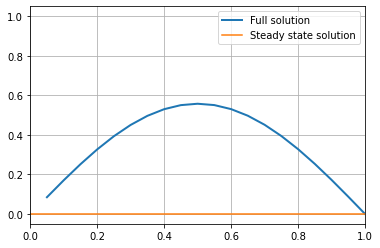

In [6]:
# Initialise arrays and equations
x, t = symbols('x t')
L = 1.
dx = 0.05
dt = 0.01
alpha = 0.1
xl = np.arange(dx,L,dx)
N = len(xl)
xp = np.insert(xl, [N], [L])
T = sin(np.pi*x)
a = np.pi*exp(-alpha*np.pi*np.pi*t)
b = 0.
Tx = [T.subs(x,xi) for xi in xl]
diagonals = [np.ones(N-1).tolist(), [-1]+(np.ones(N-1)*-2).tolist(), (np.ones(N-1)).tolist()]
S = diags(diagonals, [1, 0, -1]).toarray()

# Initialise plotting
fig = plt.figure()
ax = plt.axes(xlim=(0,L))
line, = ax.plot(xp,np.insert(Tx, [N], [b]),lw=2)
Ts = ax.plot([0.,L],[0.,b])
ax.grid()
ax.legend(['Full solution', 'Steady state solution'], loc='upper right')

def update4(i):
    global Tx
    p = line.set_data(xp,np.insert(Tx, [N], [b]))
    Tx = Tx + (alpha*dt/(dx*dx))*np.dot(S,Tx) + np.insert(np.zeros(len(Tx)-1),[0],[-a.subs(t,i*dt)*alpha*dt/dx])
    return line,

def init_fn4():
    return line,

anim4 = animation.FuncAnimation(fig, update4, init_func=init_fn4, frames=60, interval=100, blit=True)
anim4

### Periodic boundary conditions

The periodic boundary condition is defined by

$$
u_0 = u_N, \quad u_{-1} = u_{N-1}
$$

The discretised equation for the first and last mesh points are thus

$$
\frac{\mathrm{d}u_0}{\mathrm{d}t} = \frac{\alpha}{\Delta x^2} (u_{1} - 2u_0 + +u_{N-1})
$$

$$
\frac{\mathrm{d}u_{N-1}}{\mathrm{d}t} = \frac{\alpha}{\Delta x^2} (u_0 - 2u_{N-1} + u_{N-2})
$$

The matrix form is thus

$$
\frac{\mathrm{d}U}{\mathrm{d}t} = \frac{\alpha}{\Delta x^2}
\begin{bmatrix}
-2 & 1 & \cdot & \cdot & & & 1 \\
1 & -2 & 1 & \cdot & & & \cdot \\
 & 1 & -2 & 1 & & & \\
 & & \cdot & \cdot & \cdot & & \\
 & & & \cdot & \cdot & \cdot &\\
 & & & & 1 & -2 & 1 \\
1 & & & & & 1 & -2 \\
\end{bmatrix} 
\begin{bmatrix}
u_0 \\ \cdot \\ u_{i-1} \\ u_i \\ u_{i+1} \\ \cdot \\ u_{N-1} \\
\end{bmatrix}
$$

Again, there is no source term matrix generated with periodic boundary conditions.

We now apply this solution to an example, where we consider the domain $x \in [0,L]$ and the initial conditions are 

$$
T(x,0) = \sin(2 \pi x)
$$

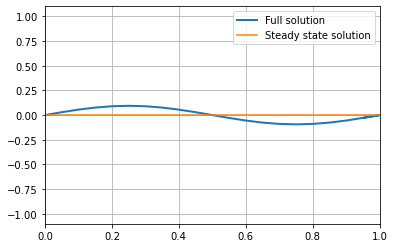

In [7]:
# Initialise arrays and equations
x, t = symbols('x t')
L = 1.
dx = 0.05
dt = 0.01
alpha = 0.2
a = 0.
b = 0.
xl = np.arange(dx,L,dx)
N = len(xl)
xl = np.insert(xl, [0], [0])
T = sin(2*np.pi*x)
Tx = [T.subs(x,xi) for xi in xl]
diagonals = [np.ones(N).tolist(), (np.ones(N+1)*-2).tolist(), (np.ones(N)).tolist(), [1], [1]]
S = diags(diagonals, [1, 0, -1, N, -N]).toarray()

# Initialise plotting
fig = plt.figure()
ax = plt.axes(xlim=(0,L))
line, = ax.plot(xl,Tx,lw=2)
Ts = ax.plot([0.,L],[a,b])
ax.grid()
ax.legend(['Full solution', 'Steady state solution'], loc='upper right')

def update4(i):
    global Tx
    p = line.set_data(np.insert(xl,[-1],[L]),np.insert(Tx,[-1],Tx[0]))
    Tx = Tx + (alpha*dt/(dx*dx))*np.dot(S,Tx)
    return line,

def init_fn4():
    return line,

anim4 = animation.FuncAnimation(fig, update4, init_func=init_fn4, frames=30, interval=100, blit=True)
anim4